In [1]:
import numpy as np
import scipy.io

In [2]:
f = open('scrambled.mat')

In [3]:
for i in range(5):
    f.readline()

In [4]:
m = []

In [5]:
line = f.readline()
while line[1:]!='':
    val = int(line[1:])
    m.append(val)
    line = f.readline()

In [6]:
x = np.array(m)
mat = x.reshape(512,512).T

In [7]:
import matplotlib.pyplot as plt

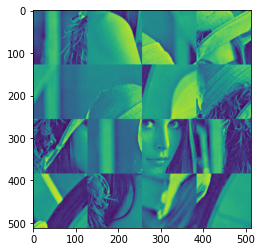

In [8]:
plt.imshow(mat)

In [9]:
class Energy:
    def __init__(self, image):
        self.image = image
        self.height = 4
        self.width = 4

    def getLeftRightEnergy(self, tile):
        try:
            i, j = tile
            x1 = 128 * i
            x2 = 128 * (i + 1)
            y = 128 * (j + 1) - 1
            diff = self.image[x1:x2,y] - self.image[x1:x2,y + 1]
            return np.sqrt((diff**2).mean())
        except IndexError:
            return 0

    def getUpDownEnergy(self, tile):
        try:
            i, j = tile
            y1 = 128 * j
            y2 = 128 * (j + 1)
            x = 128 * (i + 1) - 1
            diff = self.image[x, y1:y2] - self.image[x + 1, y1:y2]
            return np.sqrt((diff**2).mean())
        except IndexError:
            return 0

    def getEnergyAround(self, tile):
        i, j = tile
        e = np.zeros(4)
        e[0] = self.getLeftRightEnergy((i,j-1))
        e[1] = self.getLeftRightEnergy((i,j))
        e[2] = self.getUpDownEnergy((i-1,j))
        e[3] = self.getUpDownEnergy((i,j))
        return e.sum()

    def getEnergyAround2Tiles(self, t1, t2):
        return self.getEnergyAround(t1) + self.getEnergyAround(t2)

    def energy(self):
        energy = 0
        for i in range(1, self.height - 1):
            for j in range(1, self.width - 1):
                energy += self.getEnergyAround((i, j))
        return energy

    def cheatEnergy(self):                             # for testing purposes only, not used in the algorithm obviously
        return np.linalg.norm(self.image - original)

In [10]:
e = Energy(image = mat)
e.energy()

1035.15508413872

1
1094.6323835596297
1000
887.0863824563473


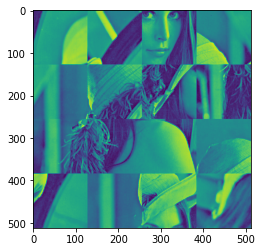

2000
881.7060842714402


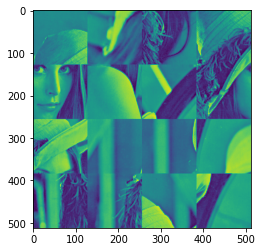

3000
839.2791915687577


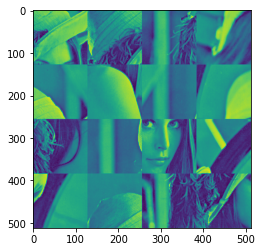

4000
917.3632275607149


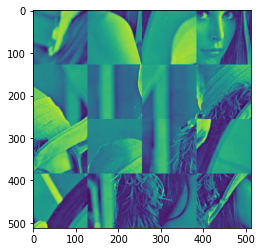

5000
935.5593623622219


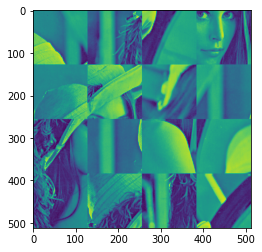

6000
809.5625000194117


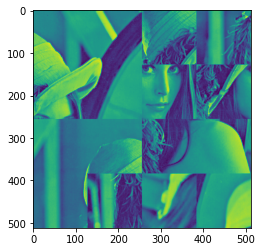

7000
631.3658223387499


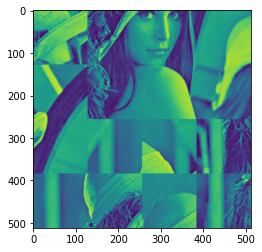

8000
401.2319306722479


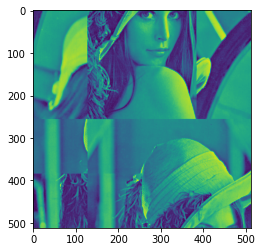

9000
398.6739362589391


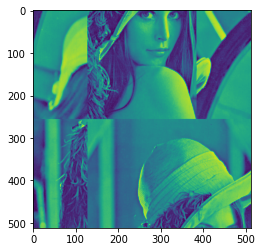

10000
398.6739362589391


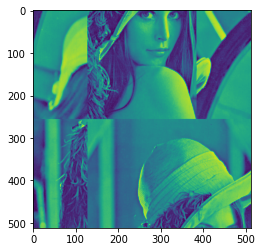

11000
398.6739362589391


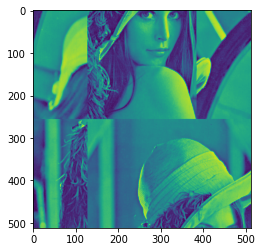

12000
398.6739362589391


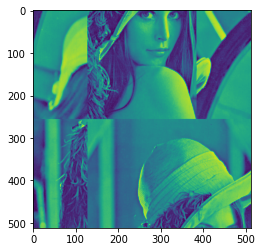

13000
398.6739362589391


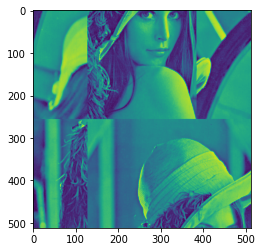

14000
398.6739362589391


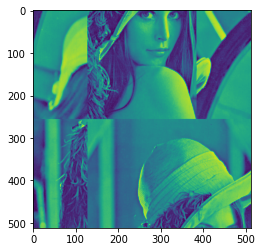

15000
398.6739362589391


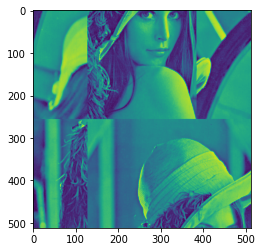

16000
398.6739362589391


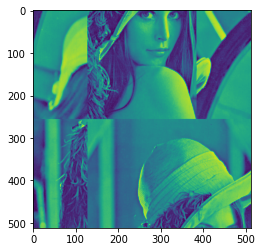

17000
398.6739362589391


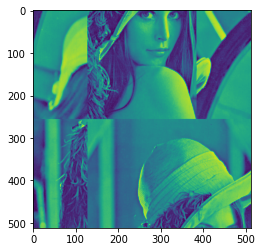

18000
398.6739362589391


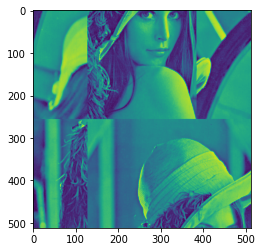

19000
398.6739362589391


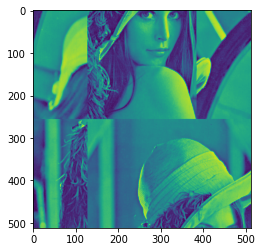

20000
398.6739362589391


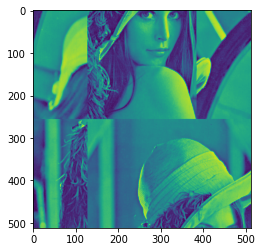

21000
398.6739362589391


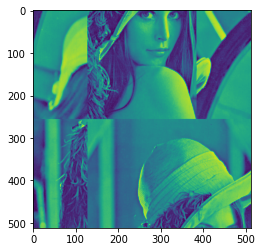

22000
398.6739362589391


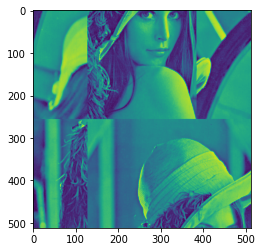

23000
398.6739362589391


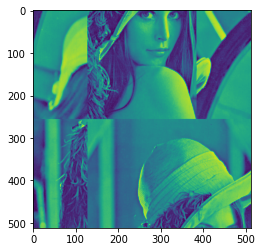

24000
398.6739362589391


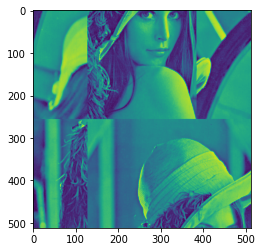

25000
398.6739362589391


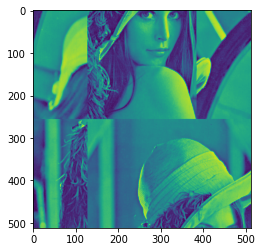

26000
398.6739362589391


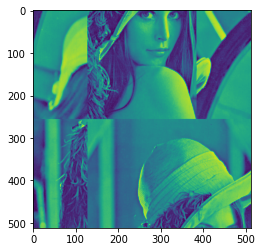

27000
398.6739362589391


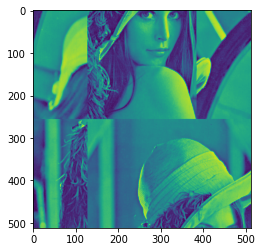

28000
398.6739362589391


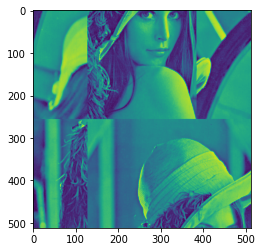

29000
398.6739362589391


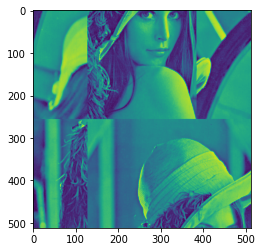

30000
398.6739362589391


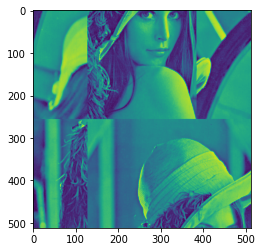

31000
398.6739362589391


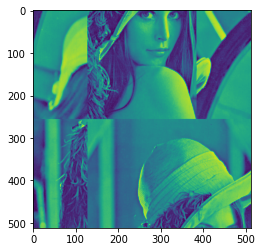

32000
398.6739362589391


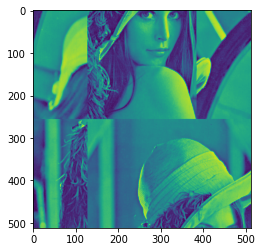

33000
398.6739362589391


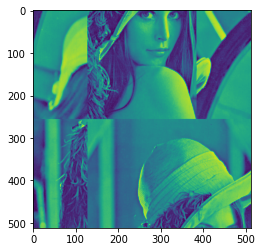

34000
398.6739362589391


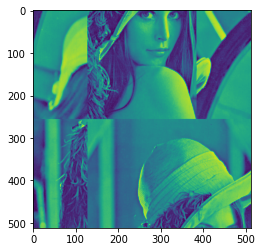

35000
398.6739362589391


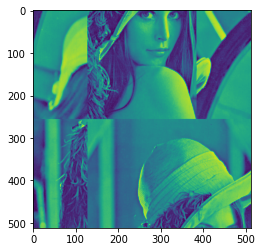

36000
398.6739362589391


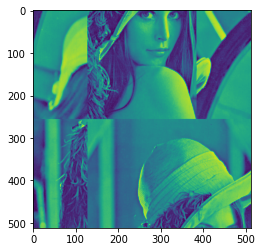

37000
398.6739362589391


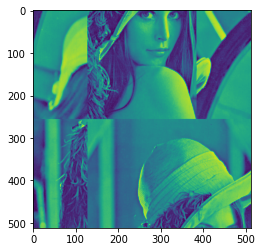

38000
398.6739362589391


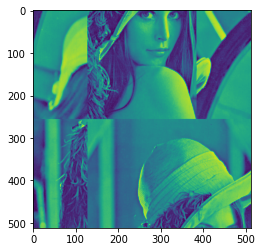

39000
398.6739362589391


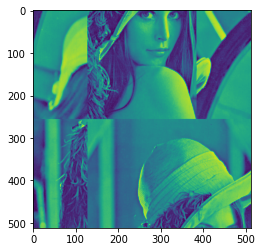

40000
398.6739362589391


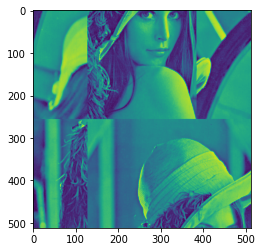

41000
398.6739362589391


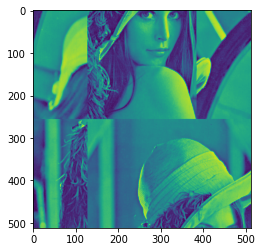

42000
398.6739362589391


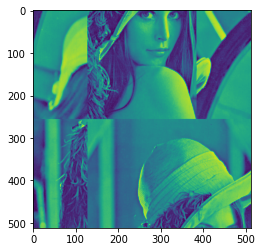

43000
398.6739362589391


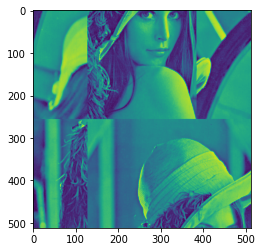

44000
398.6739362589391


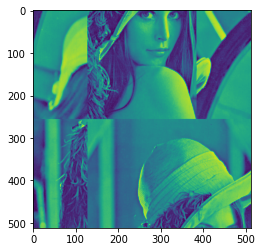

45000
398.6739362589391


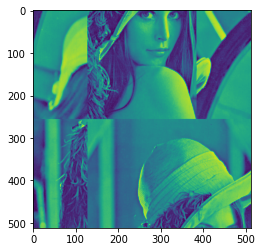

46000
398.6739362589391


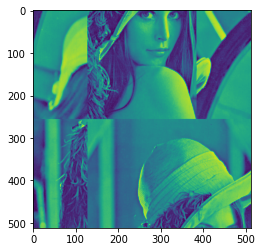

47000
398.6739362589391


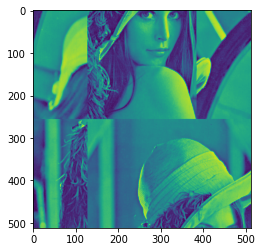

48000
398.6739362589391


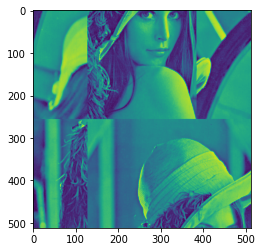

49000
398.6739362589391


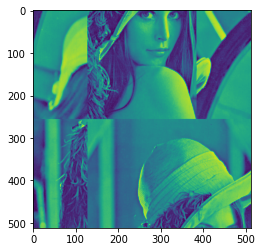

50000
398.6739362589391


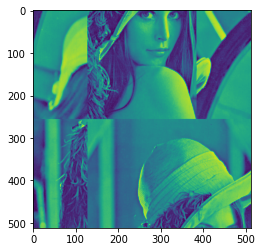

51000
398.6739362589391


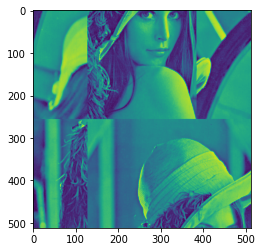

52000
398.6739362589391


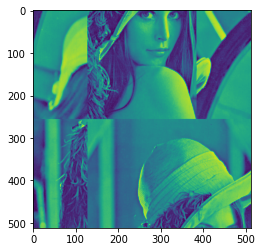

53000
398.6739362589391


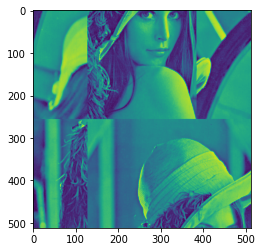

54000
398.6739362589391


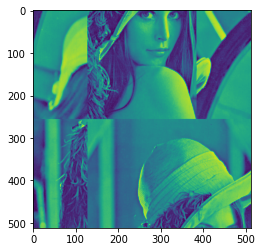

55000
398.6739362589391


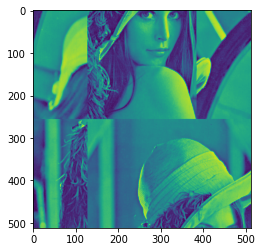

56000
398.6739362589391


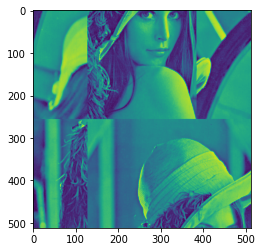

57000
398.6739362589391


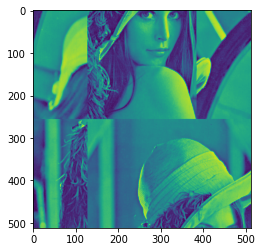

58000
398.6739362589391


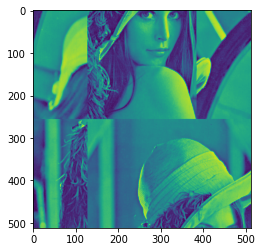

59000
398.6739362589391


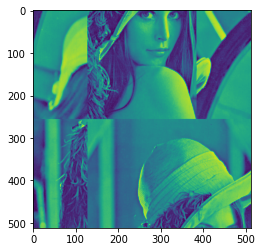

60000
398.6739362589391


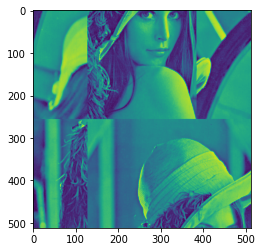

61000
398.6739362589391


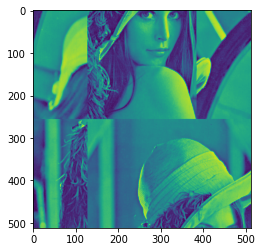

62000
398.6739362589391


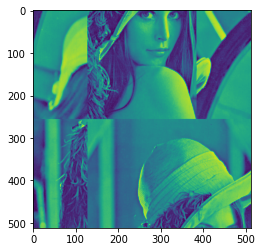

63000
398.6739362589391


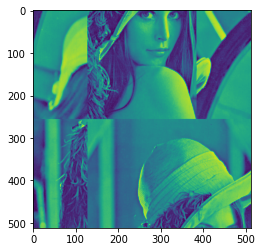

64000
398.6739362589391


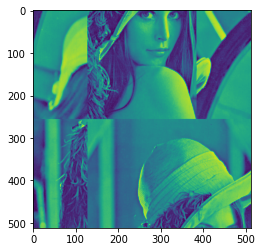

65000
398.6739362589391


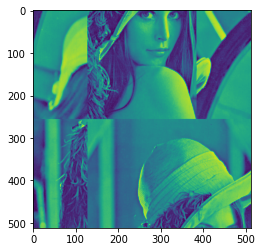

66000
398.6739362589391


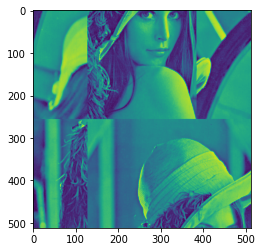

67000
398.6739362589391


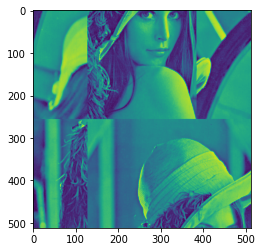

68000
398.6739362589391


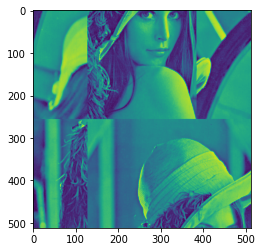

69000
398.6739362589391


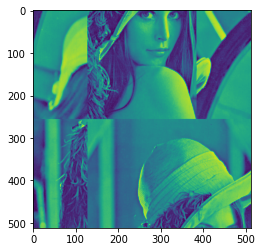

70000
398.6739362589391


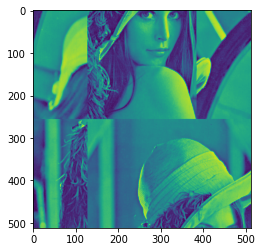

71000
398.6739362589391


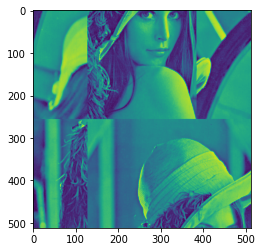

72000
398.6739362589391


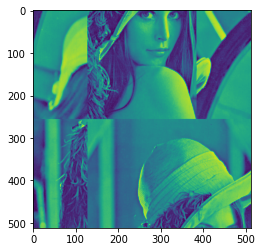

73000
398.6739362589391


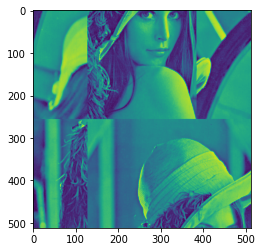

74000
398.6739362589391


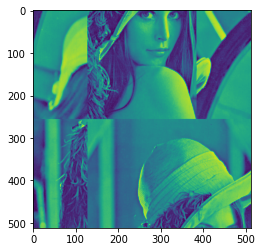

75000
398.6739362589391


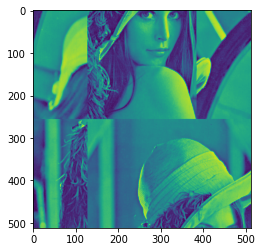

76000
398.6739362589391


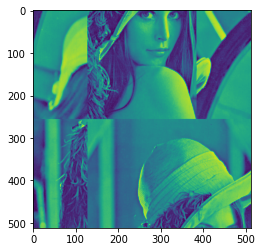

77000
398.6739362589391


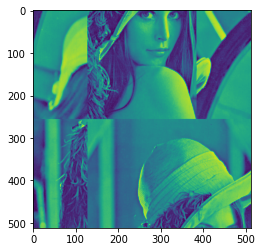

78000
398.6739362589391


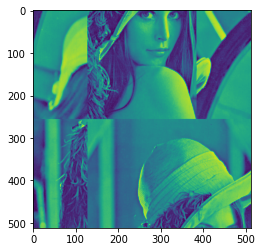

79000
398.6739362589391


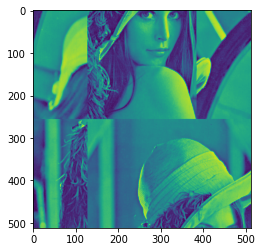

80000
398.6739362589391


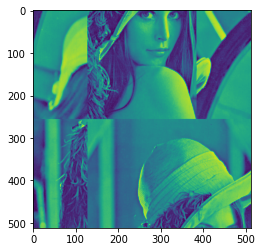

81000
398.6739362589391


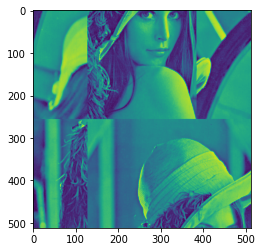

82000
398.6739362589391


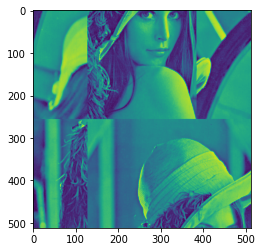

83000
398.6739362589391


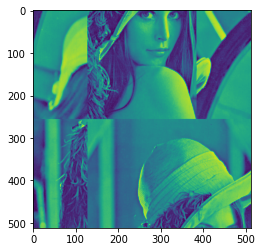

84000
398.6739362589391


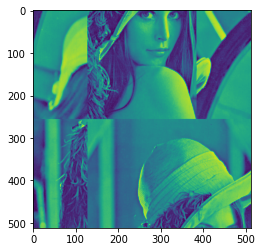

85000
398.6739362589391


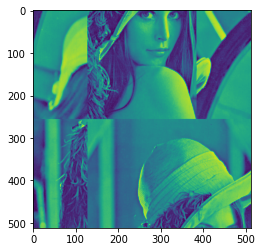

86000
398.6739362589391


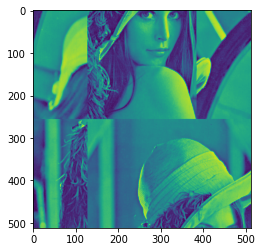

87000
398.6739362589391


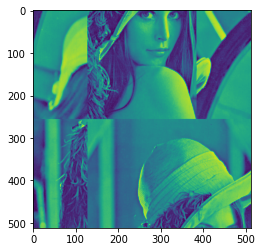

88000
398.6739362589391


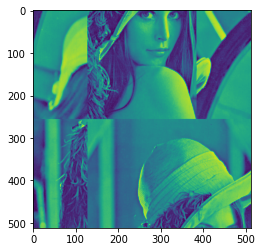

89000
398.6739362589391


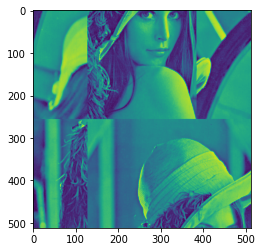

90000
398.6739362589391


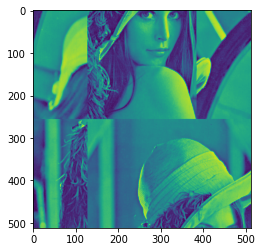

91000
398.6739362589391


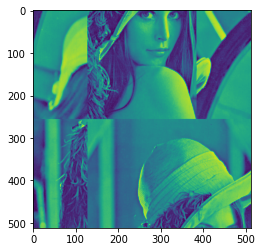

92000
398.6739362589391


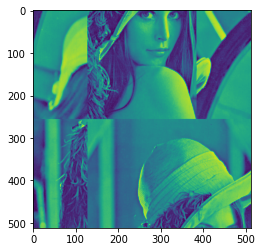

93000
398.6739362589391


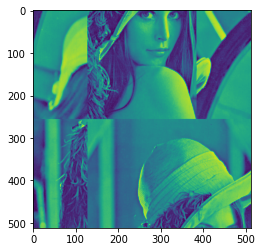

94000
398.6739362589391


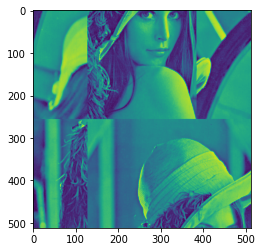

95000
398.6739362589391


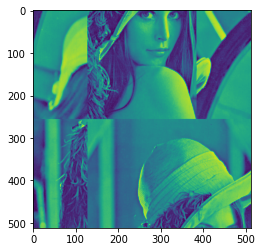

96000
398.6739362589391


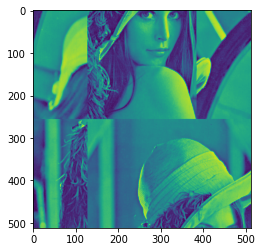

97000
398.6739362589391


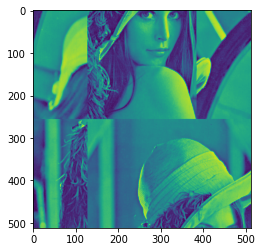

98000
398.6739362589391


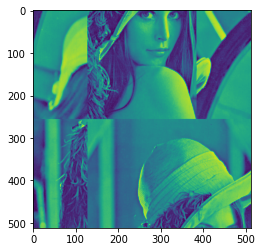

99000
398.6739362589391


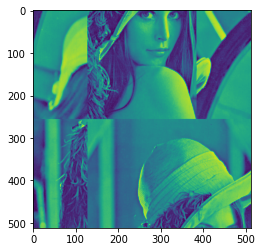

100000
398.6739362589391


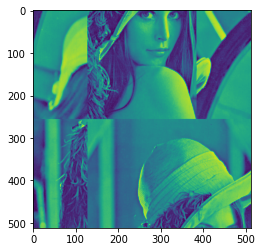

In [27]:
max_iter = 100000
temp = 1000
stop_temp = 0.00005
decay = 0.9995
x = np.arange(0,4)
y = np.arange(0,4)
curr_iter = 0
e = Energy(image = mat)
best_cost = e.energy()
best = mat
cost_list = []

while curr_iter!=max_iter and temp>=0:
    
    new = best.copy()
    np.random.shuffle(x)
    np.random.shuffle(y)
    
    cost_old = Energy(image=new).getEnergyAround2Tiles((x[0], y[0]), (x[1],y[1]))
    new[128*x[0]:128*x[0]+128, 128*y[0]:128*y[0]+128] = best[128*x[1]:128*x[1]+128, 128*y[1]:128*y[1]+128]
    new[128*x[1]:128*x[1]+128, 128*y[1]:128*y[1]+128] = best[128*x[0]:128*x[0]+128, 128*y[0]:128*y[0]+128]
    
    cost_new = Energy(image=new).getEnergyAround2Tiles((x[0], y[0]), (x[1],y[1]))
    
    if cost_new < cost_old:
        best = new
        best_cost = Energy(image=new).energy()
        
    elif np.random.rand()<np.exp(-abs(cost_old-cost_new)/temp):
        best = new
        best_cost = Energy(image=new).energy()
    
    temp = temp*decay
    curr_iter+=1
    cost_list.append(best_cost)

    if curr_iter ==1:
        print(curr_iter)
        print(best_cost)
    
    elif curr_iter%1000==0:
        print(curr_iter)
        print(best_cost)
        plt.imshow(best)
        plt.show()
    
    
    

In [25]:
np.random.shuffle(x)
x

array([2, 0, 3, 1])

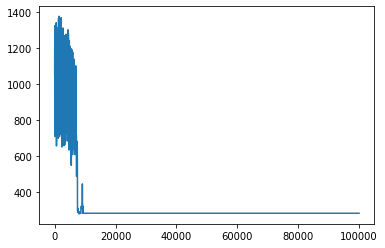

In [26]:
plt.plot(cost_list)

In [14]:
cost_list[-10:]

[386.8573629345868,
 386.8573629345868,
 386.8573629345868,
 386.8573629345868,
 386.8573629345868,
 386.8573629345868,
 386.8573629345868,
 386.8573629345868,
 386.8573629345868,
 386.8573629345868]

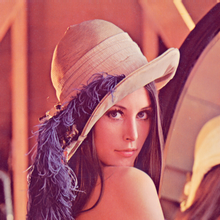

In [24]:
url = 'https://upload.wikimedia.org/wikipedia/en/thumb/7/7d/Lenna_%28test_image%29.png/220px-Lenna_%28test_image%29.png'
from PIL import Image
import urllib.request

im = Image.open(urllib.request.urlopen(url))
im

In [16]:
# original = np.array(im)

NameError: name 'im' is not defined

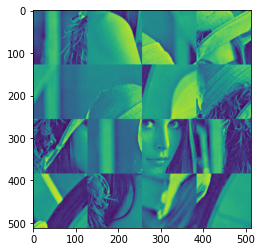

In [17]:
plt.imshow(mat)

In [18]:
Energy(image=mat).energy()

1035.15508413872

In [19]:
np.random.rand()

0.3716836163583146